<h1 style="text-align:center;">lab2</h1>
<h4 style="text-align:center;">Cristopher Barrios, Josue Sagastume</h4>
<h5 style="text-align:center;">4/8/2023</h5>


In [435]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from numpy import log
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.stattools import acf, pacf, adfuller, kpss

In [436]:
pip install statsmodels

Note: you may need to restart the kernel to use updated packages.


## Explorando datos

In [437]:
importaciones = pd.read_excel('./Data/IMPORTACION-VOLUMEN-2023-05.xlsx', skiprows=6)
consumo = pd.read_excel('./Data/CONSUMO-2023-05.xlsx', skiprows=6)
precios_2023 = pd.read_excel('./Data/Precios-Promedio-Nacionales-Diarios-2023.xlsx', sheet_name=0, skiprows=7)
precios_2022 = pd.read_excel('./Data/Precios-Promedio-Nacionales-Diarios-2023.xlsx', sheet_name=1, skiprows=6)
precios_2021 = pd.read_excel('./Data/Precios-Promedio-Nacionales-Diarios-2023.xlsx', sheet_name=2, skiprows=6)


## columnas

In [438]:
print("importaciones")
print(importaciones.columns)
print("consumo")
print(consumo.columns)
print("precios 2023")
print(precios_2023.columns)
print("precios 2022")
print(precios_2022.columns)
print("precios 2021")
print(precios_2021.columns)

importaciones
Index(['Fecha', 'Aceites lubricantes', 'Asfalto ', 'Bunker', 'Ceras',
       'Combustible turbo jet', 'Diesel bajo azufre',
       'Diesel ultra bajo azufre', 'Gas licuado de petróleo',
       'Gasolina de aviación', 'Gasolina regular', 'Gasolina superior',
       'Grasas lubricantes', 'Kerosina', 'Mezclas oleosas', 'Naftas',
       'Petcoke', 'Petróleo crudo', 'Solventes', 'Butano',
       'Diesel alto azufre', 'MTBE', 'Orimulsión', 'Petróleo reconstituido',
       'Total importación'],
      dtype='object')
consumo
Index(['Fecha', 'Aceites lubricantes', 'Asfalto', 'Bunker', 'Ceras',
       'Combustible turbo jet', 'Diesel bajo azufre',
       'Diesel ultra bajo azufre', 'Gas licuado de petróleo',
       'Gasolina de aviación', 'Gasolina regular', 'Gasolina superior',
       'Grasas lubricantes', 'Kerosina', 'Mezclas\noleosas', 'Naftas',
       'PetCoke', 'Petróleo crudo', 'Solventes', 'Butano',
       'Diesel alto azufre', 'Orimulsión', 'Total'],
      dtype='object')
p

In [439]:
importaciones.head()

,Fecha,Aceites lubricantes,Asfalto,Bunker,Ceras,Combustible turbo jet,Diesel bajo azufre,Diesel ultra bajo azufre,Gas licuado de petróleo,Gasolina de aviación,...,Naftas,Petcoke,Petróleo crudo,Solventes,Butano,Diesel alto azufre,MTBE,Orimulsión,Petróleo reconstituido,Total importación
0,2001-01-01 00:00:00,0.0,27748.99,214581.84,0.0,0.0,0.0,0.0,194065.738095,820.0,...,0.0,0.0,0.0,0.0,0.0,566101.99,8402.0,0.0,715344.0,2.312639e+06
1,2001-02-01 00:00:00,0.0,7503.57,294609.00,0.0,0.0,0.0,0.0,170703.380952,3054.0,...,0.0,0.0,0.0,0.0,0.0,489525.80,0.0,0.0,370166.0,1.769209e+06
2,2001-03-01 00:00:00,0.0,26304.32,315263.80,0.0,0.0,0.0,0.0,161837.371429,677.0,...,0.0,0.0,0.0,0.0,0.0,575559.68,0.0,0.0,360530.0,1.945770e+06
3,2001-04-01 00:00:00,0.0,7885.89,205653.00,0.0,0.0,0.0,0.0,163048.642857,3399.0,...,0.0,0.0,0.0,0.0,0.0,437745.42,8184.0,0.0,359527.0,1.623638e+06
4,2001-05-01 00:00:00,0.0,8443.16,278371.30,0.0,0.0,0.0,0.0,171518.861905,585.0,...,0.0,0.0,0.0,0.0,0.0,552609.13,12680.0,0.0,723346.0,2.262727e+06


In [440]:
print(precios_2023.head())

                 FECHA Tipo de Cambio   Superior    Regular     Diesel  \
0                  NaN        GTQ/USD  GTQ/GALON  GTQ/GALON  GTQ/GALON   
1  2023-01-01 00:00:00        7.85222      32.55      30.99      33.75   
2  2023-01-02 00:00:00        7.85222      32.55      30.99      33.75   
3  2023-01-03 00:00:00        7.84773      32.56      31.42      35.31   
4  2023-01-04 00:00:00        7.84906      32.56      31.42      35.31   

      Bunker Glp Cilindro 25Lbs. Unnamed: 7  
0  GTQ/GALON       GTQ/CIL 25 LB     GTQ/LB  
1      15.99                 122       4.88  
2      15.99                 122       4.88  
3      16.39                 122       4.88  
4      16.39                 122       4.88  


In [441]:
precios_2022.head()

,FECHA,Tipo de Cambio,Superior,Regular,Diesel,Bunker,Glp Cilindro 25Lbs.,Unnamed: 7
0,NaN,GTQ/USD,GTQ/GALON,GTQ/GALON,GTQ/GALON,GTQ/GALON,GTQ/CIL 25 LB,GTQ/LB
1,2022-01-01 00:00:00,7.71912,28.69,27.91,24.51,17.28,122,4.88
2,2022-01-02 00:00:00,7.71912,28.69,27.91,24.51,17.28,122,4.88
3,2022-01-03 00:00:00,7.71912,28.79,27.99,24.6,17.91,122,4.88
4,2022-01-04 00:00:00,7.71745,28.79,27.99,24.6,17.91,122,4.88


In [442]:
precios_2021.head()

,FECHA,Tipo de Cambio,Superior,Regular,Diesel,Bunker,Glp Cilindro 25Lbs.,Unnamed: 7
0,NaN,GTQ/USD,GTQ/GALON,GTQ/GALON,GTQ/GALON,GTQ/GALON,GTQ/CIL 25 LB,GTQ/LB
1,2021-01-01 00:00:00,7.79382,21.91,21.11,17.61,13.4,99,3.96
2,2021-01-02 00:00:00,7.79382,21.91,21.11,17.61,13.4,99,3.96
3,2021-01-03 00:00:00,7.79382,21.91,21.11,17.61,13.4,99,3.96
4,2021-01-04 00:00:00,7.79417,21.91,21.11,17.61,13.45,99,3.96


## Arreglando los datos

In [443]:
importaciones.rename(columns={'Gasolina superior': 'Superior','Gasolina regular': 'Regular'}, inplace=True)
consumo.rename(columns={'Gasolina superior': 'Superior','Gasolina regular': 'Regular'}, inplace=True)



In [444]:
Seleccion=['Fecha', 'Superior', 'Regular', 'Diesel alto azufre']
SinFecha=['Gasolina superior', 'Gasolina regular', 'Diesel alto azufre']
consumas = consumo[Seleccion]
importas = importaciones[Seleccion]


# a partir de la linea 288 para consumo ya no se toma en relevancia
# para importaciones 276
consumo = consumo[:288]
importaciones = importaciones[:276]
consumas = consumas[:270]
importas = importas[:270]

In [445]:
consumas.head()

,Fecha,Superior,Regular,Diesel alto azufre
0,2000-01-01 00:00:00,308156.82,202645.20,634667.06
1,2000-02-01 00:00:00,307766.31,205530.96,642380.66
2,2000-03-01 00:00:00,331910.29,229499.56,699807.25
3,2000-04-01 00:00:00,315648.08,210680.40,586803.98
4,2000-05-01 00:00:00,319667.97,208164.34,656948.20


In [446]:
importas.head()

,Fecha,Superior,Regular,Diesel alto azufre
0,2001-01-01 00:00:00,373963.96,177776.50,566101.99
1,2001-02-01 00:00:00,243091.07,123115.99,489525.80
2,2001-03-01 00:00:00,312084.38,161726.42,575559.68
3,2001-04-01 00:00:00,285054.89,127338.74,437745.42
4,2001-05-01 00:00:00,300913.67,168730.19,552609.13


In [447]:
consumas.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 270 entries, 0 to 269
Data columns (total 4 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   Fecha               270 non-null    object 
 1   Superior            270 non-null    float64
 2   Regular             270 non-null    float64
 3   Diesel alto azufre  270 non-null    float64
dtypes: float64(3), object(1)
memory usage: 8.6+ KB


In [448]:
importas.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 270 entries, 0 to 269
Data columns (total 4 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   Fecha               269 non-null    object 
 1   Superior            269 non-null    float64
 2   Regular             269 non-null    float64
 3   Diesel alto azufre  269 non-null    float64
dtypes: float64(3), object(1)
memory usage: 8.6+ KB


## Ahora precios

In [449]:
# Obtener los valores de la fila 0 (nombres de columna alternativos)
nombres_columnas_fila_0 = precios_2023.iloc[0]

# Crear nuevos nombres de columna combinando los nombres actuales con los de la fila 0
nuevos_nombres_columnas = [f"{nombre_actual} ({nombre_fila_0})"
                            if isinstance(nombre_fila_0, str) else nombre_actual
                            for nombre_actual, nombre_fila_0 in zip(precios_2023.columns, nombres_columnas_fila_0)]

# Asignar los nuevos nombres de columna al DataFrame (omitir la primera fila)
precios_2023.columns = nuevos_nombres_columnas
precios_2023 = precios_2023[1:].reset_index(drop=True)

# Cambiando el nombre de la ultima columna
precios_2023.rename(columns={'Unnamed: 7 (GTQ/LB)': 'Glp Cilindro 25Lbs. 7 (GTQ/LB)'}, inplace=True)

# a partir de la linea 227 para consumo ya no se toma en relevancia
#precios_2023 = precios_2023[:223]

# Eliminar la fila de la fuente (última fila en este caso)
precios_2023 = precios_2023.drop(precios_2023.index[-1])
precios_2023 = precios_2023.drop(precios_2023.index[-1])

#precios_2023 = precios_2023[:270]


In [450]:
# Obtener los valores de la fila 0 (nombres de columna alternativos)
nombres_columnas_fila_0 = precios_2022.iloc[0]

# Crear nuevos nombres de columna combinando los nombres actuales con los de la fila 0
nuevos_nombres_columnas = [f"{nombre_actual} ({nombre_fila_0})"
                            if isinstance(nombre_fila_0, str) else nombre_actual
                            for nombre_actual, nombre_fila_0 in zip(precios_2022.columns, nombres_columnas_fila_0)]

# Asignar los nuevos nombres de columna al DataFrame (omitir la primera fila)
precios_2022.columns = nuevos_nombres_columnas
precios_2022 = precios_2022[1:].reset_index(drop=True)

# Cambiando el nombre de la ultima columna
precios_2022.rename(columns={'Unnamed: 7 (GTQ/LB)': 'Glp Cilindro 25Lbs. 7 (GTQ/LB)'}, inplace=True)

# a partir de la linea 373 para consumo ya no se toma en relevancia
#precios_2022 = precios_2022[:373]

# Eliminar la fila de la fuente (última fila en este caso)
precios_2022 = precios_2022.drop(precios_2022.index[-1])
precios_2022 = precios_2022.drop(precios_2022.index[-1])

In [451]:
# Obtener los valores de la fila 0 (nombres de columna alternativos)
nombres_columnas_fila_0 = precios_2021.iloc[0]

# Crear nuevos nombres de columna combinando los nombres actuales con los de la fila 0
nuevos_nombres_columnas = [f"{nombre_actual} ({nombre_fila_0})"
                            if isinstance(nombre_fila_0, str) else nombre_actual
                            for nombre_actual, nombre_fila_0 in zip(precios_2021.columns, nombres_columnas_fila_0)]

# Asignar los nuevos nombres de columna al DataFrame (omitir la primera fila)
precios_2021.columns = nuevos_nombres_columnas
precios_2021 = precios_2021[1:].reset_index(drop=True)

# Cambiando el nombre de la ultima columna
precios_2021.rename(columns={'Unnamed: 7 (GTQ/LB)': 'Glp Cilindro 25Lbs. 7 (GTQ/LB)'}, inplace=True)

# a partir de la linea 373 para consumo ya no se toma en relevancia
#precios_2021 = precios_2021[:373]

# Eliminar la fila de la fuente (última fila en este caso)
precios_2021 = precios_2021.drop(precios_2021.index[-1])
precios_2021 = precios_2021.drop(precios_2021.index[-1])

In [452]:
precios_2023

,FECHA,Tipo de Cambio (GTQ/USD),Superior (GTQ/GALON),Regular (GTQ/GALON),Diesel (GTQ/GALON),Bunker (GTQ/GALON),Glp Cilindro 25Lbs. (GTQ/CIL 25 LB),Glp Cilindro 25Lbs. 7 (GTQ/LB)
0,2023-01-01 00:00:00,7.85222,32.55,30.99,33.75,15.99,122,4.88
1,2023-01-02 00:00:00,7.85222,32.55,30.99,33.75,15.99,122,4.88
2,2023-01-03 00:00:00,7.84773,32.56,31.42,35.31,16.39,122,4.88
3,2023-01-04 00:00:00,7.84906,32.56,31.42,35.31,16.39,122,4.88
4,2023-01-05 00:00:00,7.85221,32.56,31.42,35.31,16.39,122,4.88
...,...,...,...,...,...,...,...,...
220,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
221,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
222,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
223,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [453]:
precios_2022

,FECHA,Tipo de Cambio (GTQ/USD),Superior (GTQ/GALON),Regular (GTQ/GALON),Diesel (GTQ/GALON),Bunker (GTQ/GALON),Glp Cilindro 25Lbs. (GTQ/CIL 25 LB),Glp Cilindro 25Lbs. 7 (GTQ/LB)
0,2022-01-01 00:00:00,7.71912,28.69,27.91,24.51,17.28,122,4.88
1,2022-01-02 00:00:00,7.71912,28.69,27.91,24.51,17.28,122,4.88
2,2022-01-03 00:00:00,7.71912,28.79,27.99,24.6,17.91,122,4.88
3,2022-01-04 00:00:00,7.71745,28.79,27.99,24.6,17.91,122,4.88
4,2022-01-05 00:00:00,7.71558,28.79,27.99,24.6,17.91,122,4.88
...,...,...,...,...,...,...,...,...
360,2022-12-27 00:00:00,7.84739,32.55,30.99,33.75,15.99,122,4.88
361,2022-12-28 00:00:00,7.85028,32.55,30.99,33.75,15.99,122,4.88
362,2022-12-29 00:00:00,7.85222,32.55,30.99,33.75,15.99,122,4.88
363,2022-12-30 00:00:00,7.85222,32.55,30.99,33.75,15.99,122,4.88


In [454]:
precios_2021

,FECHA,Tipo de Cambio (GTQ/USD),Superior (GTQ/GALON),Regular (GTQ/GALON),Diesel (GTQ/GALON),Bunker (GTQ/GALON),Glp Cilindro 25Lbs. (GTQ/CIL 25 LB),Glp Cilindro 25Lbs. 7 (GTQ/LB)
0,2021-01-01 00:00:00,7.79382,21.91,21.11,17.61,13.4,99,3.96
1,2021-01-02 00:00:00,7.79382,21.91,21.11,17.61,13.4,99,3.96
2,2021-01-03 00:00:00,7.79382,21.91,21.11,17.61,13.4,99,3.96
3,2021-01-04 00:00:00,7.79417,21.91,21.11,17.61,13.45,99,3.96
4,2021-01-05 00:00:00,7.79369,21.91,21.11,17.61,13.45,99,3.96
...,...,...,...,...,...,...,...,...
360,2021-12-27 00:00:00,7.71628,28.69,27.91,24.51,17.28,122,4.88
361,2021-12-28 00:00:00,7.72447,28.69,27.91,24.51,17.28,122,4.88
362,2021-12-29 00:00:00,7.71924,28.69,27.91,24.51,17.28,122,4.88
363,2021-12-30 00:00:00,7.71912,28.69,27.91,24.51,17.28,122,4.88


---------------------------

In [455]:

# Uniendo las 3 hojas
precios = pd.concat([precios_2023, precios_2022, precios_2021], ignore_index=True)

precios.rename(columns={'FECHA': 'Fecha','Superior (GTQ/GALON)': 'Superior','Regular (GTQ/GALON)': 'Regular','Diesel (GTQ/GALON)': 'Diesel'}, inplace=True)
precios.columns
columnas_seleccion = ['Fecha', 'Superior',
                      'Regular', 'Diesel']
preciosas = precios[columnas_seleccion]


In [456]:
preciosas

,Fecha,Superior,Regular,Diesel
0,2023-01-01 00:00:00,32.55,30.99,33.75
1,2023-01-02 00:00:00,32.55,30.99,33.75
2,2023-01-03 00:00:00,32.56,31.42,35.31
3,2023-01-04 00:00:00,32.56,31.42,35.31
4,2023-01-05 00:00:00,32.56,31.42,35.31
...,...,...,...,...
950,2021-12-27 00:00:00,28.69,27.91,24.51
951,2021-12-28 00:00:00,28.69,27.91,24.51
952,2021-12-29 00:00:00,28.69,27.91,24.51
953,2021-12-30 00:00:00,28.69,27.91,24.51


## Importacion

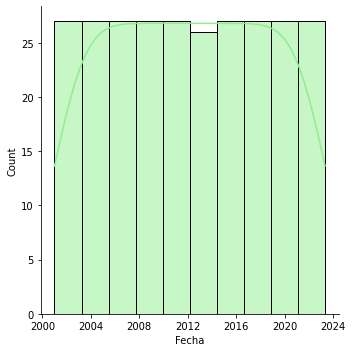

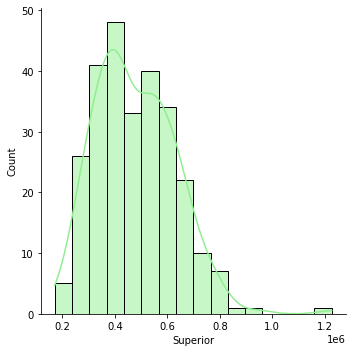

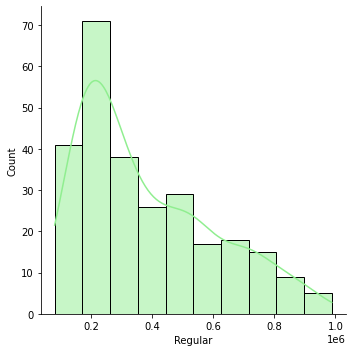

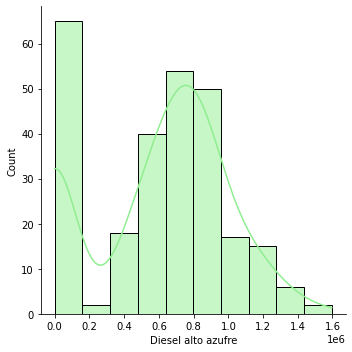

In [457]:
for var in Seleccion:
    sns.displot(importas[var], kde=True, color = 'lightgreen')

(array([41., 71., 38., 26., 29., 17., 18., 15.,  9.,  5.]),
 array([ 81015.3  , 171700.975, 262386.65 , 353072.325, 443758.   ,
        534443.675, 625129.35 , 715815.025, 806500.7  , 897186.375,
        987872.05 ]),
 <BarContainer object of 10 artists>)

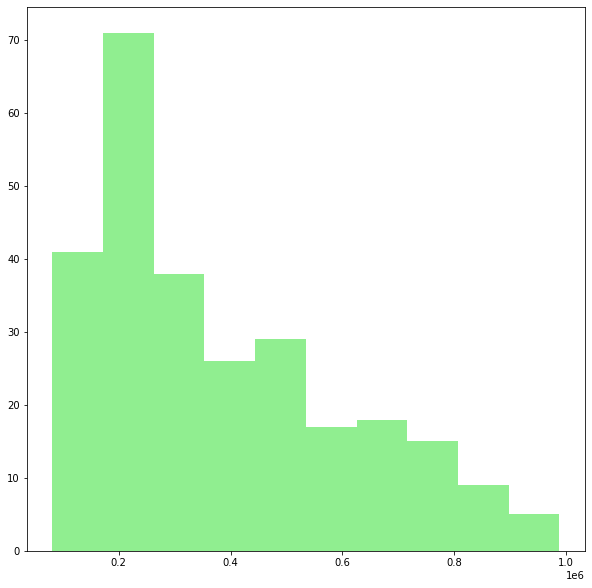

In [458]:
plt.hist(importas.Regular, color="lightgreen")

(array([21., 64., 61., 61., 42., 16.,  2.,  1.,  0.,  1.]),
 array([ 170292.5  ,  275980.603,  381668.706,  487356.809,  593044.912,
         698733.015,  804421.118,  910109.221, 1015797.324, 1121485.427,
        1227173.53 ]),
 <BarContainer object of 10 artists>)

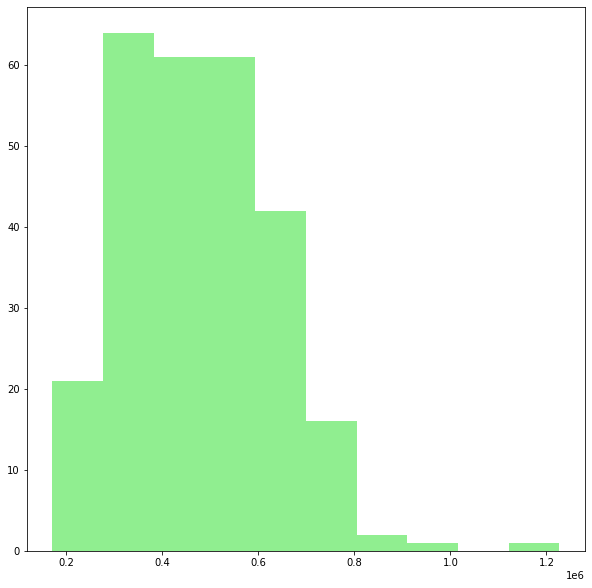

In [459]:
plt.hist(importas.Superior, color="lightgreen")

(array([65.,  2., 18., 40., 54., 50., 17., 15.,  6.,  2.]),
 array([      0.   ,  159569.856,  319139.712,  478709.568,  638279.424,
         797849.28 ,  957419.136, 1116988.992, 1276558.848, 1436128.704,
        1595698.56 ]),
 <BarContainer object of 10 artists>)

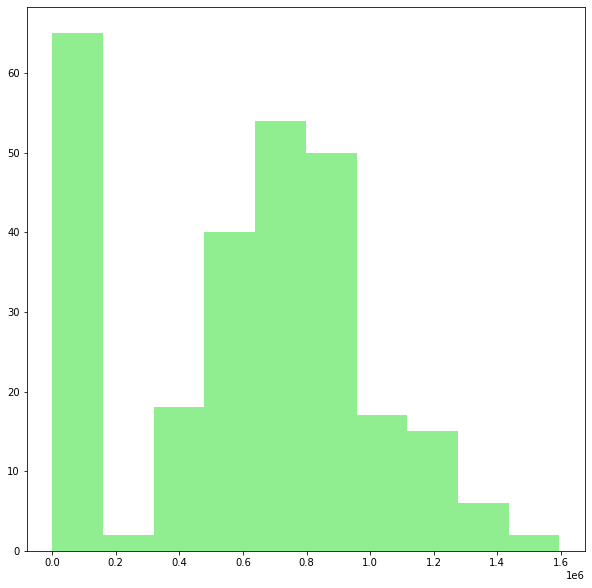

In [460]:
plt.hist(importas['Diesel alto azufre'], color="lightgreen")

## Consumo

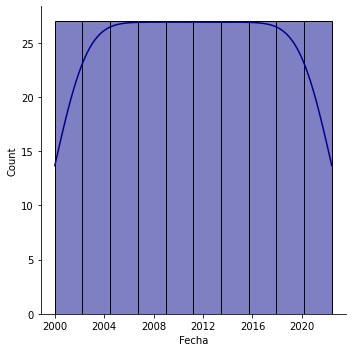

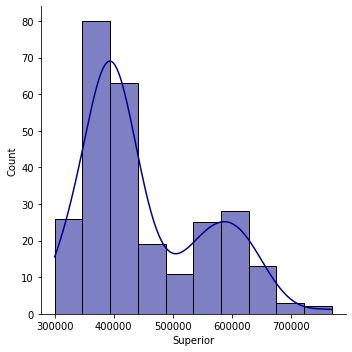

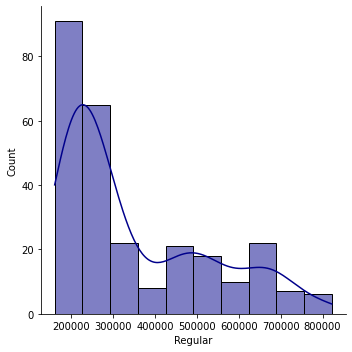

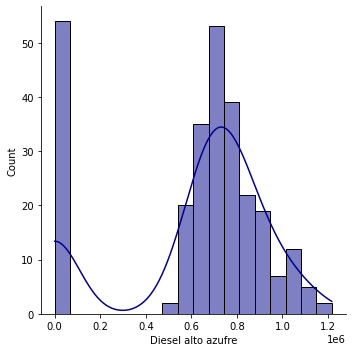

In [461]:
for var in Seleccion:
    sns.displot(consumas[var], kde=True, color='darkblue')

(array([91., 65., 22.,  8., 21., 18., 10., 22.,  7.,  6.]),
 array([160741.9  , 226855.925, 292969.95 , 359083.975, 425198.   ,
        491312.025, 557426.05 , 623540.075, 689654.1  , 755768.125,
        821882.15 ]),
 <BarContainer object of 10 artists>)

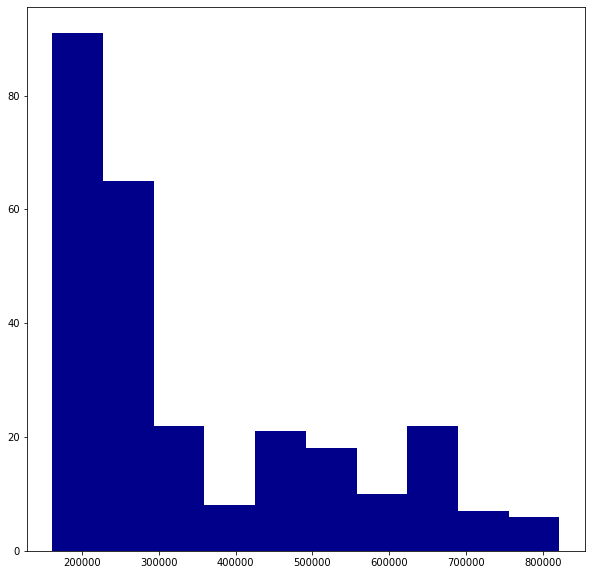

In [462]:
plt.hist(consumas.Regular, color="darkblue")

(array([26., 80., 63., 19., 11., 25., 28., 13.,  3.,  2.]),
 array([300242.78166667, 347028.7865    , 393814.79133333, 440600.79616667,
        487386.801     , 534172.80583333, 580958.81066667, 627744.8155    ,
        674530.82033333, 721316.82516667, 768102.83      ]),
 <BarContainer object of 10 artists>)

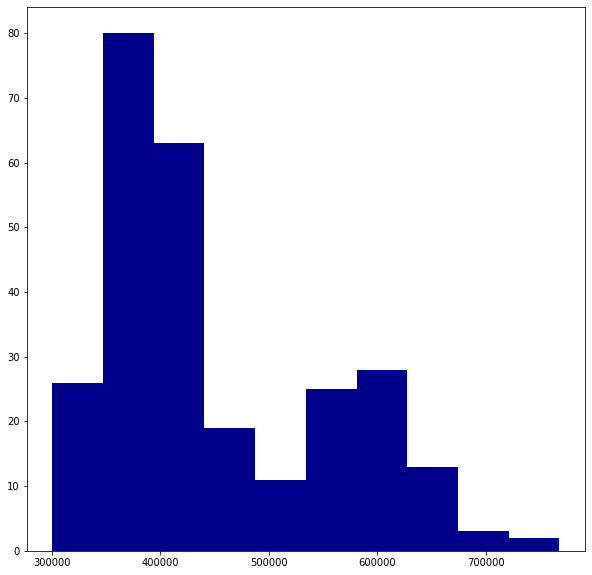

In [463]:
plt.hist(consumas.Superior, color="darkblue")

(array([54.,  0.,  0.,  0., 22., 77., 64., 31., 16.,  6.]),
 array([      0.   ,  121642.342,  243284.684,  364927.026,  486569.368,
         608211.71 ,  729854.052,  851496.394,  973138.736, 1094781.078,
        1216423.42 ]),
 <BarContainer object of 10 artists>)

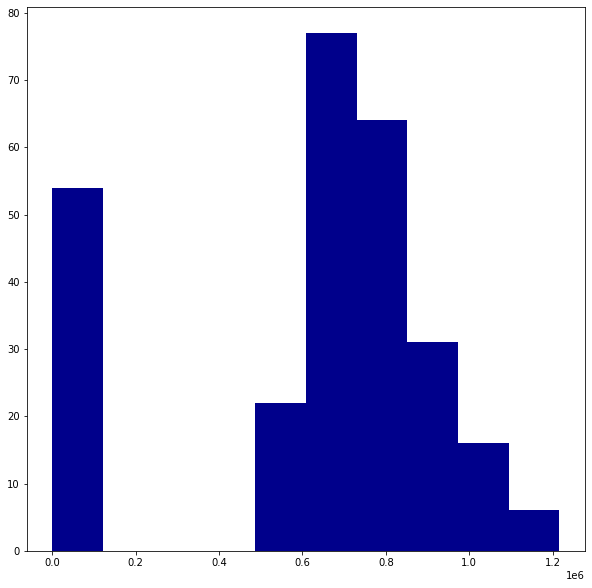

In [464]:
plt.hist(consumas['Diesel alto azufre'], color="darkblue")

## Precios

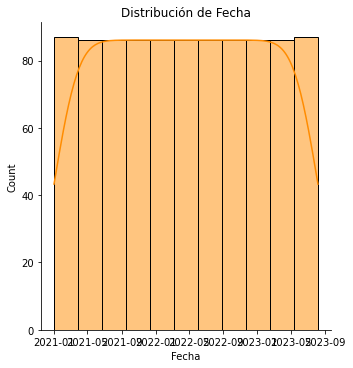

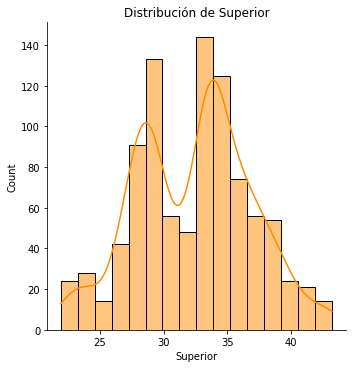

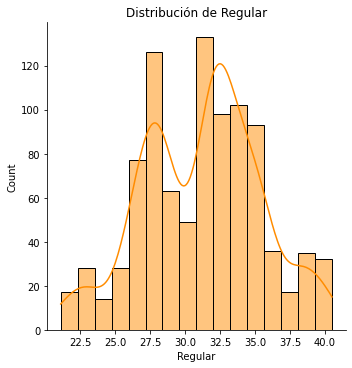

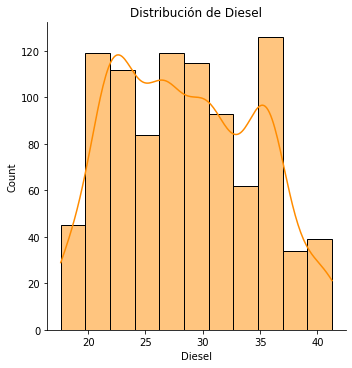

In [465]:

# Iterar a través de las columnas y generar los gráficos
for col in columnas_seleccion:
    try:
        sns.displot(preciosas[col], kde=True, color='darkorange')
        plt.title(f'Distribución de {col}')
        plt.show()
    except Exception as e:
        print(f"Error al generar el gráfico para '{col}': {e}")

c:\Users\cjrba\AppData\Local\Programs\Python\Python39\lib\site-packages\numpy\lib\histograms.py:837: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= first_edge)
c:\Users\cjrba\AppData\Local\Programs\Python\Python39\lib\site-packages\numpy\lib\histograms.py:838: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= last_edge)


(array([ 38.,  21.,  84., 182.,  77., 196., 165., 101.,  45.,  39.]),
 array([21.11, 23.049, 24.988, 26.927, 28.866, 30.805, 32.744, 34.683,
        36.622, 38.561, 40.5], dtype=object),
 <BarContainer object of 10 artists>)

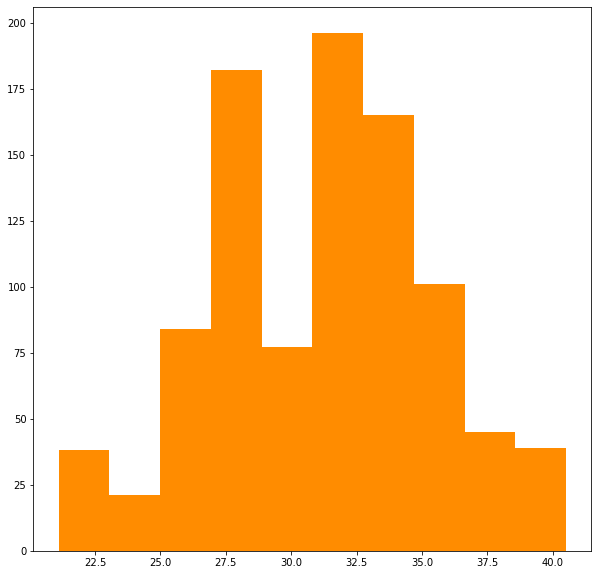

In [489]:
plt.hist(preciosas.Regular, color="darkorange")

(array([ 45.,  21., 126., 161.,  83., 224., 131.,  84.,  45.,  28.]),
 array([21.91, 24.043, 26.176000000000002, 28.309, 30.442, 32.575, 34.708,
        36.841, 38.974000000000004, 41.107, 43.24], dtype=object),
 <BarContainer object of 10 artists>)

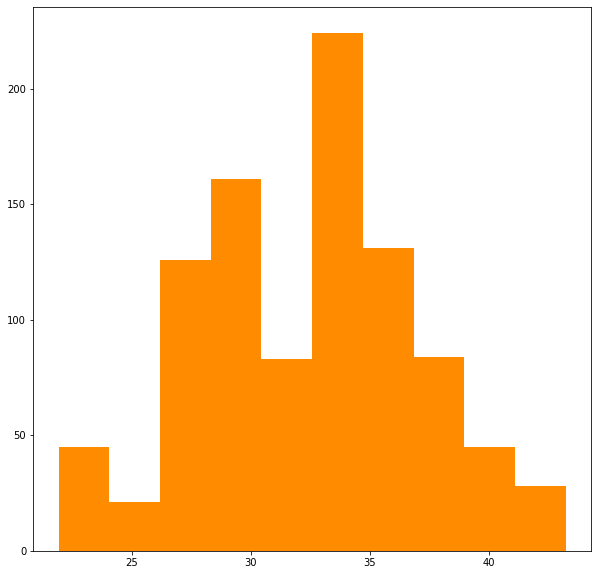

In [490]:
plt.hist(preciosas.Superior, color="darkorange")

(array([ 52., 126., 140., 133.,  77., 115.,  91., 134.,  41.,  39.]),
 array([17.61, 19.976, 22.342, 24.708000000000002, 27.074, 29.44,
        31.806000000000004, 34.172000000000004, 36.538000000000004, 38.904,
        41.27], dtype=object),
 <BarContainer object of 10 artists>)

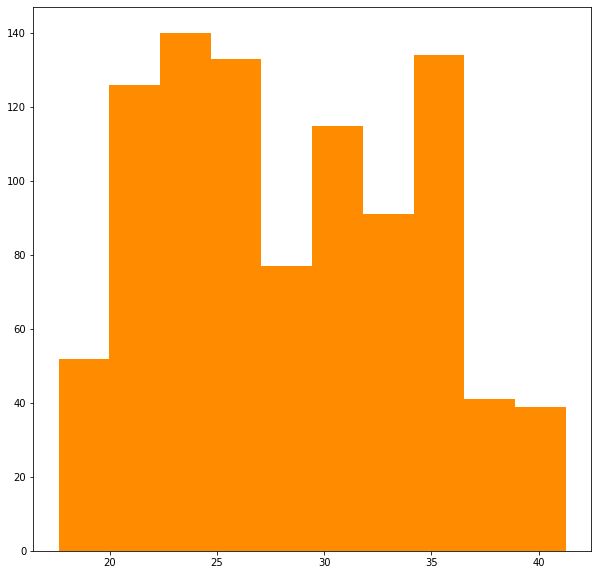

In [491]:
plt.hist(preciosas.Diesel, color="darkorange")

In [466]:
consumas['Date'] = pd.to_datetime(consumas['Fecha'], format='%Y%m$d %H%M$s')

In [467]:
importas['Date'] = pd.to_datetime(importas['Fecha'], format='%Y%m$d %H%M$s')

In [468]:
consumas.head()

,Fecha,Superior,Regular,Diesel alto azufre,Date
0,2000-01-01 00:00:00,308156.82,202645.20,634667.06,2000-01-01
1,2000-02-01 00:00:00,307766.31,205530.96,642380.66,2000-02-01
2,2000-03-01 00:00:00,331910.29,229499.56,699807.25,2000-03-01
3,2000-04-01 00:00:00,315648.08,210680.40,586803.98,2000-04-01
4,2000-05-01 00:00:00,319667.97,208164.34,656948.20,2000-05-01


In [469]:
importas.head()

,Fecha,Superior,Regular,Diesel alto azufre,Date
0,2001-01-01 00:00:00,373963.96,177776.50,566101.99,2001-01-01
1,2001-02-01 00:00:00,243091.07,123115.99,489525.80,2001-02-01
2,2001-03-01 00:00:00,312084.38,161726.42,575559.68,2001-03-01
3,2001-04-01 00:00:00,285054.89,127338.74,437745.42,2001-04-01
4,2001-05-01 00:00:00,300913.67,168730.19,552609.13,2001-05-01


In [470]:
consumas.index = consumas.Date
importas.index = importas.Date


def plot_df(x, y, title="", xlabel='Date', ylabel='Value', dpi=1000):
    plt.figure(figsize=(16,5), dpi=dpi)
    plt.plot(x, y, color='tab:red')
    plt.gca().set(title=title, xlabel=xlabel, ylabel=ylabel)
    plt.show()

In [471]:
plot_df(x=consumas.Date, y=consumas.Superior, title='Consumo de Super')
plot_df(x=consumas.Date, y=consumas.Regular, title='Consumo de Regular')
plot_df(x=consumas.Date, y=consumas['Diesel alto azufre'], title='Consumo de diesel')

In [472]:
importas.head()

,Fecha,Superior,Regular,Diesel alto azufre,Date
Date,,,,,
2001-01-01,2001-01-01 00:00:00,373963.96,177776.50,566101.99,2001-01-01
2001-02-01,2001-02-01 00:00:00,243091.07,123115.99,489525.80,2001-02-01
2001-03-01,2001-03-01 00:00:00,312084.38,161726.42,575559.68,2001-03-01
2001-04-01,2001-04-01 00:00:00,285054.89,127338.74,437745.42,2001-04-01
2001-05-01,2001-05-01 00:00:00,300913.67,168730.19,552609.13,2001-05-01


In [473]:
plot_df(x=importas.Date, y=importas.Superior, title='Importacion de Super')
plot_df(x=importas.Date, y=importas.Regular, title='Importacion de Regular')
plot_df(x=importas.Date, y=importas['Diesel alto azufre'], title='Importacion de Diesel')

# Descomposiciones

### Super

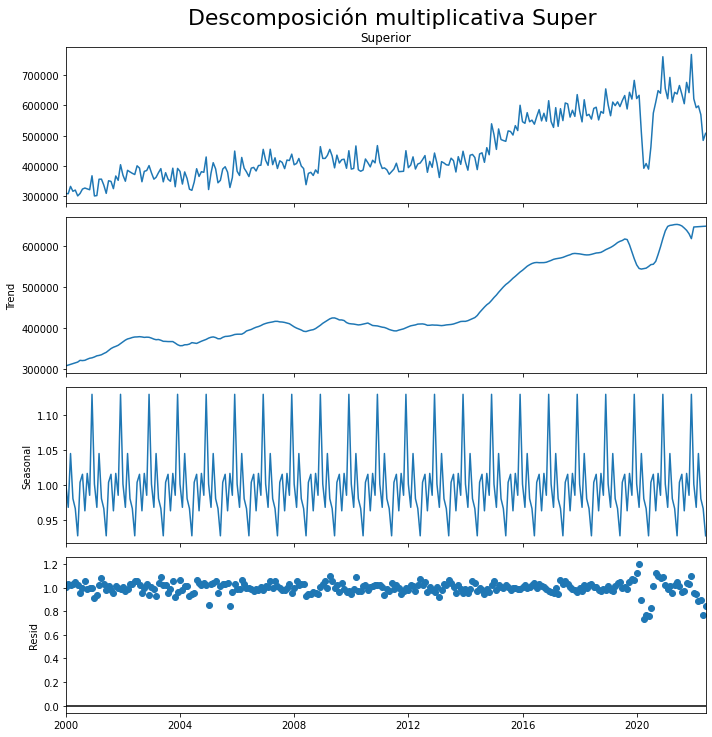

In [474]:
result_mul = seasonal_decompose(
    consumas['Superior'], 
    model='multiplicative', 
    extrapolate_trend='freq'
)

plt.rcParams.update({'figure.figsize': (10,10)})
_ = result_mul.plot().suptitle('Descomposición multiplicativa Super', fontsize=22, x=0.55, y=1.02)

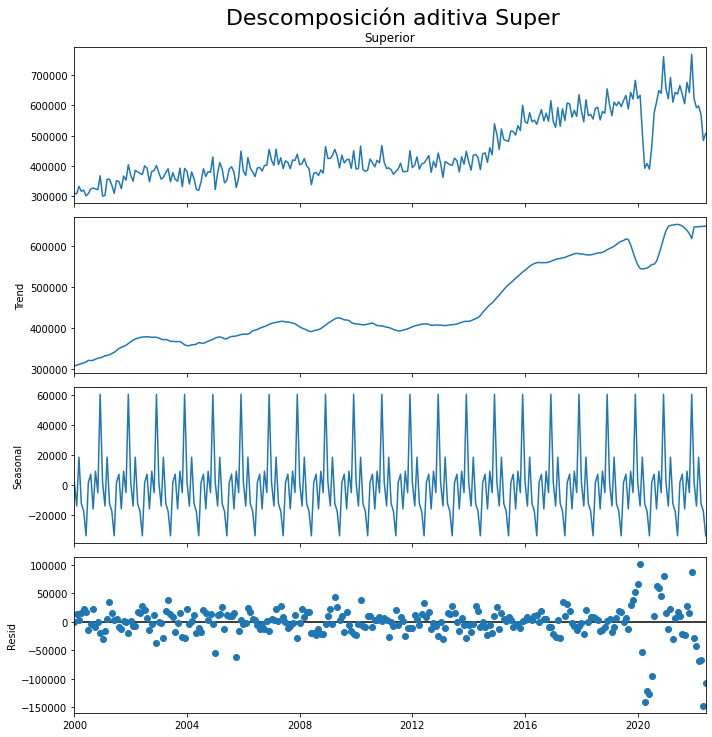

In [475]:
result_add = seasonal_decompose(consumas['Superior'], model='additive', extrapolate_trend='freq')
plt.rcParams.update({'figure.figsize': (10,10)})
_ = result_add.plot().suptitle('Descomposición aditiva Super', fontsize=22, x=0.55, y=1.02)

### Regular

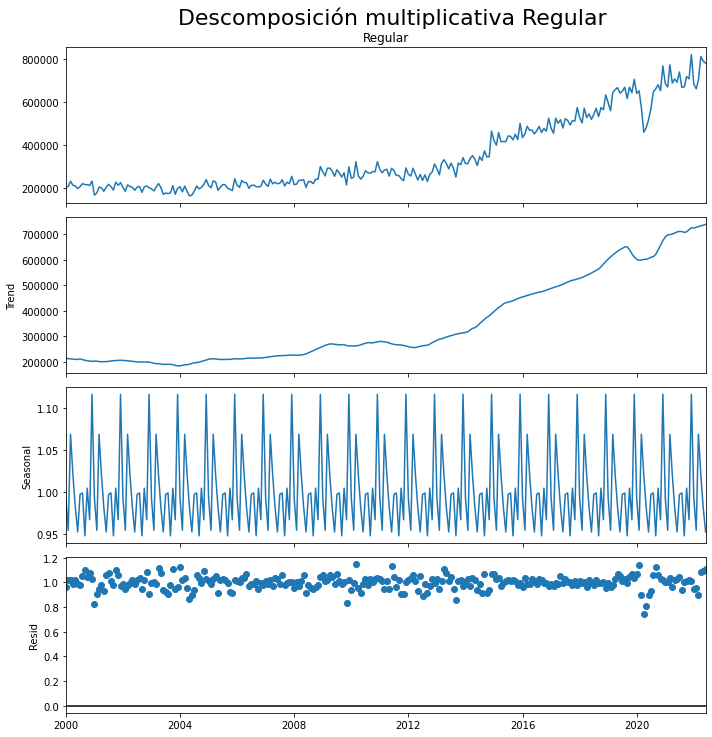

In [476]:
result_mul = seasonal_decompose(
    consumas['Regular'], 
    model='multiplicative', 
    extrapolate_trend='freq'
)

plt.rcParams.update({'figure.figsize': (10,10)})
_ = result_mul.plot().suptitle('Descomposición multiplicativa Regular', fontsize=22, x=0.55, y=1.02)

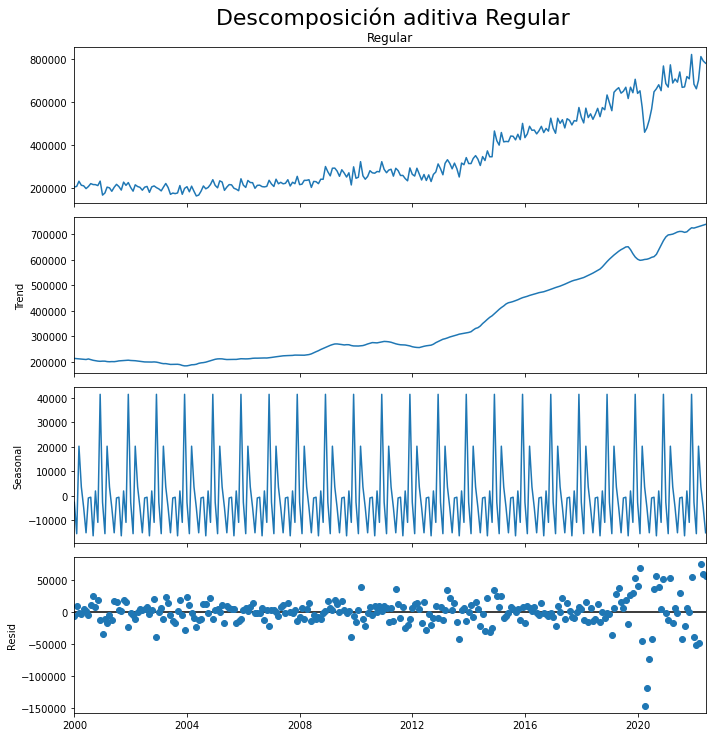

In [477]:
result_add = seasonal_decompose(consumas['Regular'], model='additive', extrapolate_trend='freq')
plt.rcParams.update({'figure.figsize': (10,10)})
_ = result_add.plot().suptitle('Descomposición aditiva Regular', fontsize=22, x=0.55, y=1.02)

## Transformaciones

### Consumo

In [478]:
logConsumoSuper = np.log10(consumas.Superior)

result = adfuller(logConsumoSuper)

print('p-value: %f' % result[1])

p-value: 0.606998


In [479]:
logConsumoRegular = np.log10(consumas.Regular)

result = adfuller(logConsumoRegular)

print('p-value: %f' % result[1])

p-value: 0.995445


### Importación

In [480]:
logImportacionSuper = np.log10(importas.Superior)

# adf test
result = adfuller(logImportacionSuper)

print('p-value: %f' % result[1])

p-value: nan


In [481]:
logImportacionRegular = log(importas.Regular)

# adf test
result = adfuller(logImportacionRegular)

print('p-value: %f' % result[1])

p-value: nan


## Conjunto de Entrenamiento y Dick Fuller

### Gasolinas

In [482]:
train = int(len(consumas) * 0.7)
trainConsumo = consumas[0:train]
PConsumo = consumas[train:len(consumas)]
trainConsumo = trainConsumo.set_index(['Fecha'])
PConsumo = PConsumo.set_index(['Fecha'])

In [483]:
tRegular = trainConsumo['Regular']

dfTest = adfuller(tRegular, autolag='AIC')
salida = pd.Series(dfTest[0:4], index=['Estadístico de prueba','p-value','# de retardos usados','# de observaciones usadas'])
for key,value in dfTest[4].items():
        salida['Valor Crítico (%s)'%key] = value
print(salida)

Estadístico de prueba          2.108943
p-value                        0.998799
# de retardos usados          12.000000
# de observaciones usadas    176.000000
Valor Crítico (1%)            -3.468062
Valor Crítico (5%)            -2.878106
Valor Crítico (10%)           -2.575602
dtype: float64


In [484]:
tSuper = trainConsumo['Superior']

dfTest = adfuller(tRegular, autolag='AIC')
salida = pd.Series(dfTest[0:4], index=['Estadístico de prueba','p-value','# de retardos usados','# de observaciones usadas'])
for key,value in dfTest[4].items():
        salida['Valor Crítico (%s)'%key] = value
print(salida)

Estadístico de prueba          2.108943
p-value                        0.998799
# de retardos usados          12.000000
# de observaciones usadas    176.000000
Valor Crítico (1%)            -3.468062
Valor Crítico (5%)            -2.878106
Valor Crítico (10%)           -2.575602
dtype: float64


In [485]:
tDiesel = trainConsumo['Diesel alto azufre']

dfTest = adfuller(tDiesel, autolag='AIC')
salida = pd.Series(dfTest[0:4], index=['Estadístico de prueba','p-value','# de retardos usados','# de observaciones usadas'])
for key,value in dfTest[4].items():
        salida['Valor Crítico (%s)'%key] = value
print(salida)

Estadístico de prueba         -0.417058
p-value                        0.907212
# de retardos usados          12.000000
# de observaciones usadas    176.000000
Valor Crítico (1%)            -3.468062
Valor Crítico (5%)            -2.878106
Valor Crítico (10%)           -2.575602
dtype: float64


En los tres conjuntos de resultados, observamos p-values significativamente mayores que el umbral convencional de 0.05, lo que sugiere que no hay suficiente evidencia para rechazar la hipótesis nula. En este contexto, la hipótesis nula generalmente se refiere a la presencia de raíces unitarias en la serie de datos.

Dado que no podemos rechazar la hipótesis nula en ninguno de los casos debido a los p-values elevados, esto implica que no hay suficiente evidencia estadística para afirmar que la serie de datos es estacionaria en media. En otras palabras, la serie no muestra un comportamiento constante a lo largo del tiempo y podría tener una tendencia persistente.

## Media y desviacion estandar

### Diesel

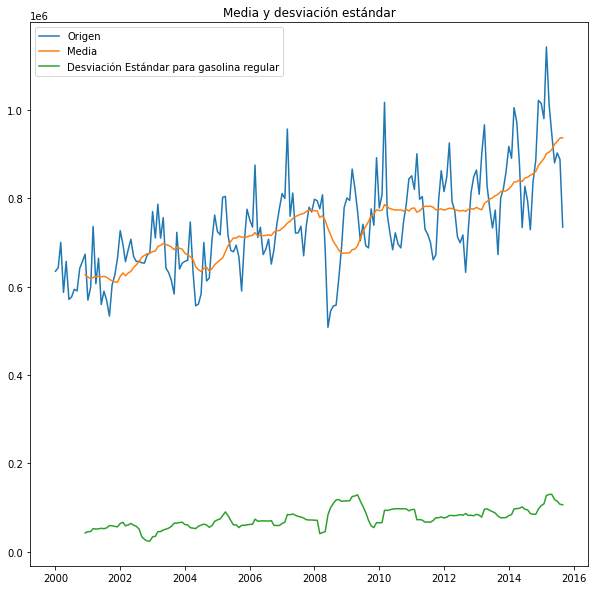

In [486]:
td = trainConsumo['Diesel alto azufre']
media = td.rolling(window=12).mean()
Desviacion = td.rolling(window=12).std()

Org = plt.plot(td, label="Origen")
media = plt.plot(media, label = 'Media')
DE = plt.plot(Desviacion, label = 'Desviación Estándar para gasolina regular')
plt.title('Media y desviación estándar')
plt.legend(loc='best')

### Super

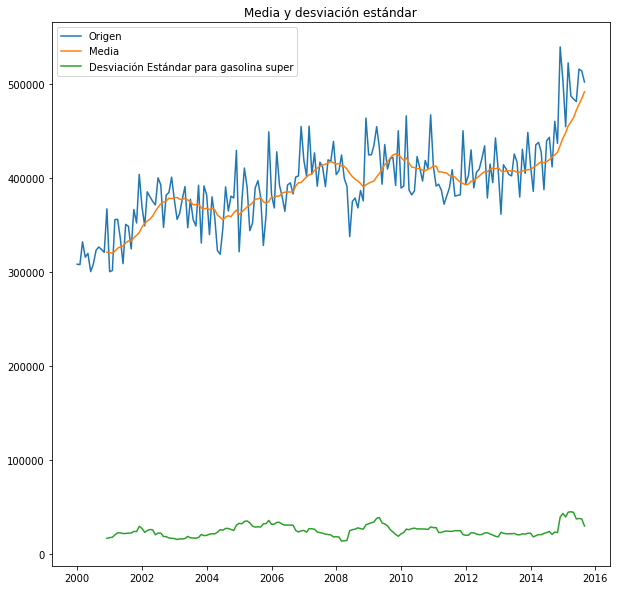

In [487]:
ts = trainConsumo['Superior']
media = ts.rolling(window=12).mean()
Desviacion = ts.rolling(window=12).std()

Org = plt.plot(ts, label="Origen")
media = plt.plot(media, label = 'Media')
DE = plt.plot(Desviacion, label = 'Desviación Estándar para gasolina super')
plt.title('Media y desviación estándar')
plt.legend(loc='best')

### Regular

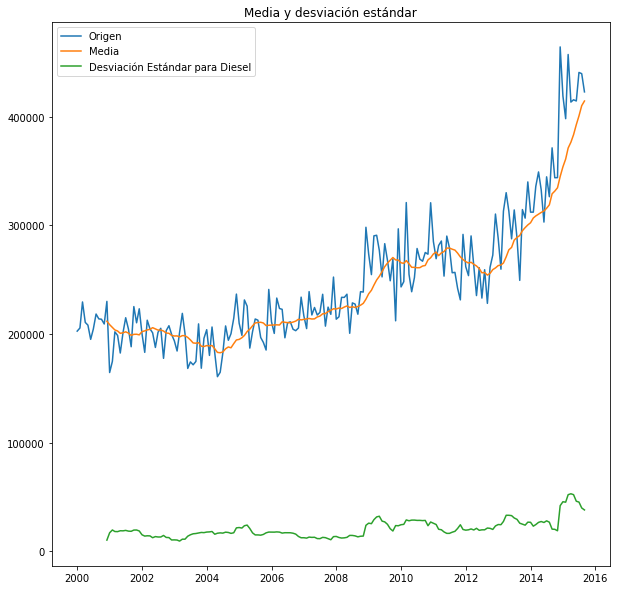

In [488]:
tr = trainConsumo['Regular']
media = tr.rolling(window=12).mean()
Desviacion = tr.rolling(window=12).std()

Org = plt.plot(tr, label="Origen")
media = plt.plot(media, label = 'Media')
DE = plt.plot(Desviacion, label = 'Desviación Estándar para Diesel')
plt.title('Media y desviación estándar')
plt.legend(loc='best')